In [2]:
from pycocotools.coco import COCO
from os import path
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from IPython.display import display, HTML

import pandas as pd
import numpy as np

import json
import glob
import math

/var/folders/n9/8dr8vdcj2dl7rvt8y69nxd880000gn/T/ipykernel_54978/727969417.py:9: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [3]:
dataset_directory = "/Users/mft/dev/ai-for-bears/albear/data/02_intermediate/bearfacelabeling/bearface"
output_dir = path.join(dataset_directory, 'predict')

In [4]:
def display_pred(bb_data, ax):
    bb = bb_data[0]
    style = bb_data[1]
    rect = patches.Rectangle(
        (bb[0], bb[1]),
        bb[2],
        bb[3],
        linewidth=2,
        facecolor='none',
        **style
    )
    ax.add_patch(rect)
    return ax


def display_image_data(image, bboxes_data):
    fig, ax = plt.subplots(1)
    ax.imshow(image)

    for bb_data in bboxes_data:
        display_pred(bb_data, ax)
    
    plt.show()

In [5]:
bbox_pred_columns = ['pred_left', 'pred_top', 'pred_right', 'pred_bottom']
bbox_truth_columns = ['truth_left', 'truth_top', 'truth_right', 'truth_bottom']
pixel_error_columns = ['pixel_error_0', 'pixel_error_1', 'pixel_error_2','pixel_error_3']
normalised_pixel_error_columns = ['normalised_pixel_error_0', 'normalised_pixel_error_1', 'normalised_pixel_error_2','normalised_pixel_error_3']
mvt_columns = ['label_mouvements_10', 'label_mouvements_5', 'label_mouvements_3']

In [6]:
def to_left_top_right_bottom(bbox):
    if bbox:
        return [bbox[0], bbox[1], bbox[2] + bbox[0] ,bbox[3] + bbox[1]]
    else:
        return [float('nan'), float('nan'), float('nan'), float('nan')]

def compute_row(annotation, images, predictions, subdir_name):
    img = images[annotation['image_id']]
    bbox_pred = predictions[img['file_name']]
    bbox_truth = annotation['bbox']
    return [path.join(subdir_name,img['file_name']), img['width'], img['height']]+ to_left_top_right_bottom(bbox_pred) + to_left_top_right_bottom(bbox_truth)

def load_data():
    partial_dfs = []
    for subdir_name in ['train', 'valid']:
        subdir = path.join(dataset_directory, subdir_name)

        #load annotation
        annotation_path = path.join(subdir, '_annotations.coco.json')
        coco = COCO(annotation_path)

        #load prediction
        output_subdir = path.join(output_dir, subdir_name)
        prediction_filenames = glob.glob(path.join(output_subdir, '*.json'))
        predicted_bboxs = {}
        for filename in prediction_filenames:
            with open(filename) as f:
                data = json.load(f)
                predicted_bboxs[data['image_path']] = data['bbox']

        df_ = pd.DataFrame(
                    (compute_row(ann, coco.imgs, predicted_bboxs, subdir_name) for ann in coco.anns.values()),
                    columns = [
                        'img',
                        'width',
                        'height',
                        'pred_left', 
                        'pred_top', 
                        'pred_right', 
                        'pred_bottom', 
                        'truth_left', 
                        'truth_top', 
                        'truth_right', 
                        'truth_bottom'
                    ])
        partial_dfs.append(df_)

    return pd.concat(partial_dfs)

def has_nan(values):
    return any( v!=v for v in values)

def iou_for_overlapping_bbox(boxA, boxB):
    # determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # compute the area of intersection rectangle
    interArea = (xB - xA) * (yB - yA)

    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)

    # return the intersection over union value
    return iou

def compute_iou(row):
    A = row[bbox_pred_columns].to_list()
    B = row[bbox_truth_columns].to_list()

    if has_nan(A) or has_nan(B):
        return 0

    if A[0] > B[2] or A[2] < B[0] or A[1] > B[3] or A[3] < B[1]:
        # there is no intersection:
        return 0
    else:
        return iou_for_overlapping_bbox(A, B)


def compute_pixel_delta(row):
    A = row[bbox_pred_columns].to_list()
    B = row[bbox_truth_columns].to_list()
    if has_nan(A) or has_nan(B):
        width = row['width']
        height = row['height']
        # return sorted([width, height, width, height])
        return [150, 150, 150, 150]

    return sorted(np.abs(np.array(A)-np.array(B)).tolist())

def compute_normalized_pixel_delta(row):
    A = row[bbox_pred_columns].to_list()
    B = row[bbox_truth_columns].to_list()

    length = (B[2] - B[0] + B[3] - B[1])/2
    if has_nan(A) or has_nan(B):
        return [1, 1, 1, 1]

    return sorted((np.abs(np.array(A)-np.array(B))/length).tolist())
        

def compute_label_mouvements(threshold):
    def intern(row):
        return (row[['pixel_error_0', 'pixel_error_1', 'pixel_error_2','pixel_error_3']]>threshold).sum()
    return intern

def show_histogram_series(df,ax, bins, q_values = None):
    hist, bins = np.histogram(df.to_list(), bins = bins)
    hist_normalised = hist.astype(np.float32) / hist.sum()
    ax.bar(bins[:-1], hist_normalised, width=(bins[1]-bins[0]))
    if q_values:
        f_range = [0, hist_normalised.max()]
        ax.add_patch(patches.Rectangle((q_values[0], f_range[0]), q_values[1]-q_values[0], f_range[1]-f_range[0], linewidth=1, edgecolor='r', facecolor='none'))
    ax.set_title(df.name)
    
def show_histograms(df, quantile_radius = None):
    bins = 100

    get_q_values = lambda S, q, r : list(map(lambda v: S.quantile(v), [max(0, q-r), min(q+r,1)]))
    if isinstance(df,pd.Series):
        fig, ax = plt.subplots(1,1)
        q_values = []
        if quantile_radius:
            q, r = quantile_radius
            q_values = get_q_values(df, q, r)
        show_histogram_series(df, ax, bins, q_values)
        return fig, ax
    else:    
        fig, ax = plt.subplots(int(len(df.columns)/2), 2, constrained_layout=True)
        ax = ax.flatten()
        for i, column in enumerate(df.columns):
            q_values = []
            if quantile_radius:
                q, r = quantile_radius[i]
                q_values = get_q_values(df[df.columns[i]], q, r)
            show_histogram_series(df[df.columns[i]], ax[i], bins, q_values)
        return fig,ax



In [7]:
def display_pred(bb_data, ax):
    bb = bb_data[0]
    style = bb_data[1]
    rect = patches.Rectangle(
        (bb[0], bb[1]),
        bb[2]-bb[0],
        bb[3]-bb[1],
        linewidth=2,
        facecolor='none',
        **style
    )
    ax.add_patch(rect)
    return ax

def display_image_data(image, bboxes_data, ax):
    ax.imshow(image)
    for bb_data in bboxes_data:
        display_pred(bb_data, ax)

def display_entry(entry, ax):
    image_path = path.join(dataset_directory, entry.img)
    bbox_truth = entry[bbox_truth_columns].to_list()
    bbox_pred = entry[bbox_pred_columns].to_list()
    image = Image.open(image_path)

    display_image_data(image,
    [
        (bbox_truth,{'edgecolor': 'g'}),
        (bbox_pred,{'edgecolor': 'r', 'linestyle':'--'})
    ], ax)

def display_entries(entries, ncols = 1, figsize=10):
    fig, ax = plt.subplots(math.ceil(len(entries)/ncols), ncols, figsize=(figsize,figsize))
    ax = ax.flatten()
    for i in range(len(entries)):
        display_entry(entries.iloc[i],ax[i])
        ax[i].axis('off') 
    plt.tight_layout()
    plt.show()

def around_quantile(df, column, quantile, radius, nelems=16):
    q1 = df[column].quantile(max(0,quantile - radius))
    q2 = df[column].quantile(min(quantile + radius,1))
    result = df[df[column].between(q1, q2)]
    return result.sample(n=nelems)

def show_histogram_samples_from_quantile(df, column, quantile, radius, nelems = 12, ncols = 3, figsize = 10):
    show_histograms(df[column],(quantile,radius))
    display_entries(around_quantile(df, column, quantile, radius, nelems = nelems), ncols = ncols, figsize=figsize)

In [8]:
df = load_data()

df['IoU'] = df.apply(compute_iou, axis = 1)

df[pixel_error_columns] = df.apply(compute_pixel_delta, axis = 1, result_type='expand')

df[normalised_pixel_error_columns] = df.apply(compute_normalized_pixel_delta, axis = 1, result_type='expand')

df['label_mouvements_10'] = df.apply(compute_label_mouvements(10), axis = 1)
df['label_mouvements_5'] = df.apply(compute_label_mouvements(5), axis = 1)
df['label_mouvements_3'] = df.apply(compute_label_mouvements(3), axis = 1)

# print(df.shape)
# df.tail()

df.drop(columns = bbox_pred_columns + bbox_truth_columns).describe()

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


,width,height,IoU,pixel_error_0,pixel_error_1,pixel_error_2,pixel_error_3,normalised_pixel_error_0,normalised_pixel_error_1,normalised_pixel_error_2,normalised_pixel_error_3,label_mouvements_10,label_mouvements_5,label_mouvements_3
count,2161.000000,2161.000000,2161.000000,2161.000000,2161.000000,2161.000000,2161.000000,2.161000e+03,2161.000000,2161.000000,2161.000000,2161.000000,2161.000000,2161.000000
mean,1605.705692,1169.701064,0.844026,6.107985,9.568440,15.872743,30.020494,2.898833e-02,0.041124,0.063905,0.111452,1.427117,2.624711,3.205460
std,286.306252,229.692432,0.148386,19.455556,23.400337,36.259869,52.298333,1.240096e-01,0.130876,0.192887,0.229093,1.083712,1.118167,0.919132
min,720.000000,428.000000,0.000000,0.000240,0.052063,0.529236,1.132648,5.644289e-07,0.000143,0.001536,0.003148,0.000000,0.000000,0.000000
25%,1500.000000,1024.000000,0.818392,1.212911,3.413025,5.886228,10.878845,3.898271e-03,0.011119,0.019574,0.036966,1.000000,2.000000,3.000000
50%,1536.000000,1125.000000,0.878075,2.827301,5.675011,9.034049,17.371965,9.369519e-03,0.019676,0.032124,0.061166,1.000000,3.000000,3.000000
75%,1954.000000,1466.000000,0.921893,5.198158,8.481079,13.221556,30.990356,1.917342e-02,0.031266,0.049371,0.110541,2.000000,4.000000,4.000000
max,2120.000000,2118.000000,0.992100,242.268127,449.714139,702.504839,883.904785,1.264184e+00,1.371895,3.675702,4.280305,4.000000,4.000000,4.000000


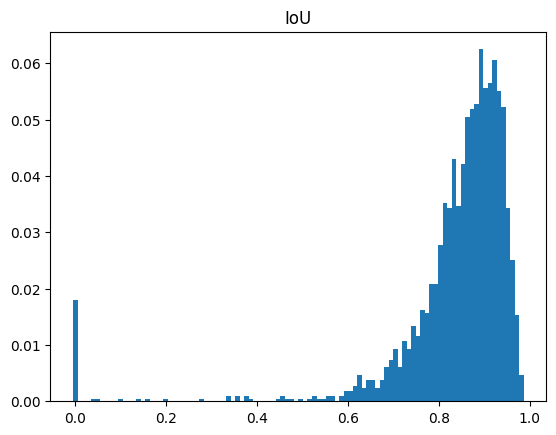

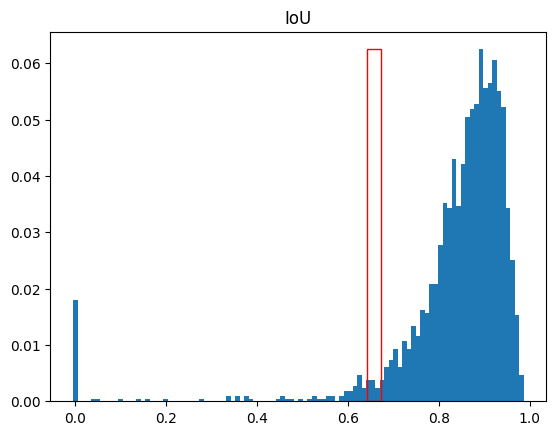

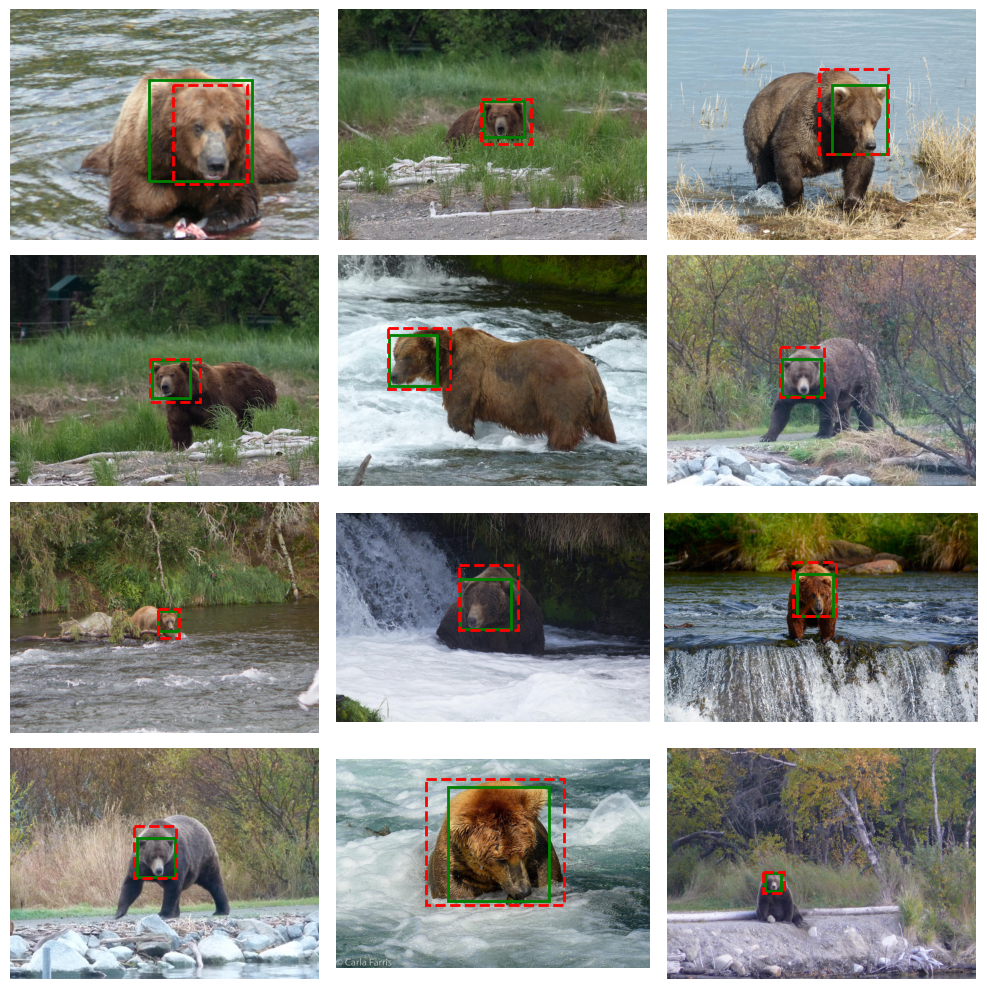

In [13]:
show_histograms(df['IoU'])
show_histogram_samples_from_quantile(df, 'IoU', quantile = 0.05,
                                     radius = 0.005,nelems = 12, ncols = 3, figsize = 10)

,pixel_error_0,pixel_error_1,pixel_error_2,pixel_error_3
count,2161.000000,2161.000000,2161.000000,2161.000000
mean,6.107985,9.568440,15.872743,30.020494
std,19.455556,23.400337,36.259869,52.298333
min,0.000240,0.052063,0.529236,1.132648
50%,2.827301,5.675011,9.034049,17.371965
75%,5.198158,8.481079,13.221556,30.990356
90%,7.772949,11.750262,22.503906,54.846313
max,242.268127,449.714139,702.504839,883.904785


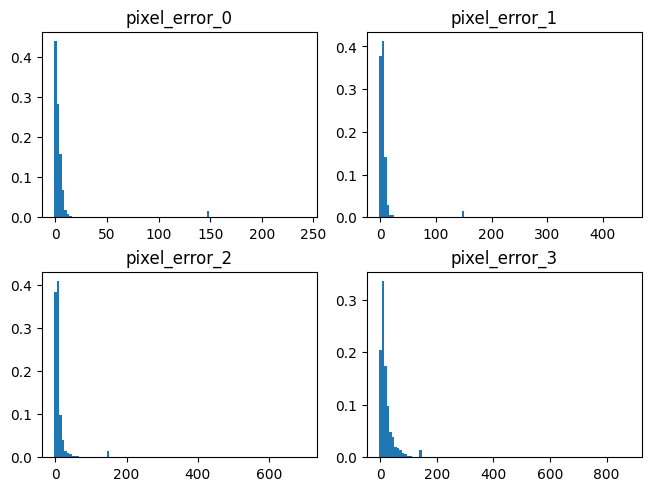

In [251]:
fig, ax = show_histograms(df[pixel_error_columns])
display(df[pixel_error_columns].describe(percentiles = [.5, 0.75, 0.9]))

,normalised_pixel_error_0,normalised_pixel_error_1,normalised_pixel_error_2,normalised_pixel_error_3
count,2.161000e+03,2161.000000,2161.000000,2161.000000
mean,2.898833e-02,0.041124,0.063905,0.111452
std,1.240096e-01,0.130876,0.192887,0.229093
min,5.644289e-07,0.000143,0.001536,0.003148
50%,9.369519e-03,0.019676,0.032124,0.061166
75%,1.917342e-02,0.031266,0.049371,0.110541
90%,3.051569e-02,0.045840,0.081186,0.194571
max,1.264184e+00,1.371895,3.675702,4.280305


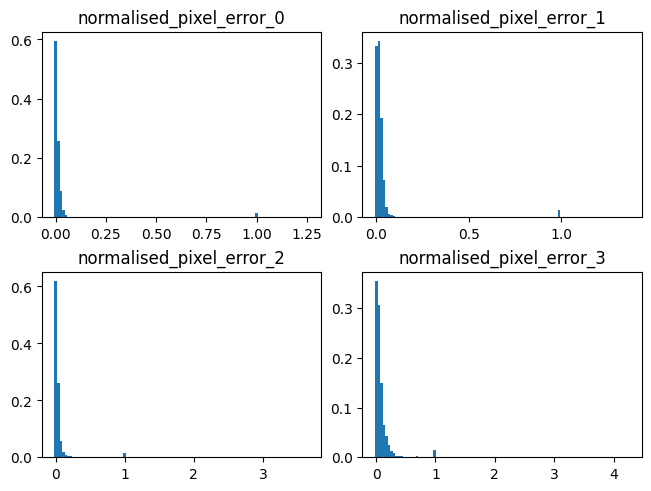

In [252]:
fig, ax = show_histograms(df[normalised_pixel_error_columns])
display(df[normalised_pixel_error_columns].describe(percentiles = [.5, 0.75, 0.9]))

,label_mouvements_10,label_mouvements_5,label_mouvements_3
count,2161.000000,2161.000000,2161.000000
mean,1.427117,2.624711,3.205460
std,1.083712,1.118167,0.919132
min,0.000000,0.000000,0.000000
25%,1.000000,2.000000,3.000000
50%,1.000000,3.000000,3.000000
75%,2.000000,4.000000,4.000000
max,4.000000,4.000000,4.000000


<Axes: xlabel='threshold'>

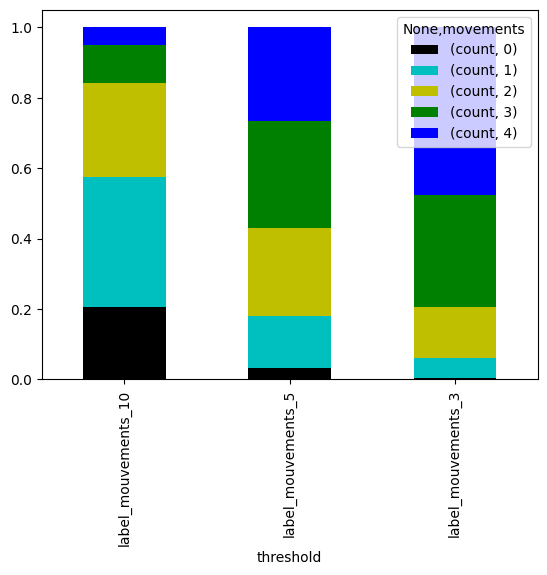

In [260]:
display(df[mvt_columns].describe())

result = pd.concat([ df[col].value_counts().to_frame()/df[col].value_counts().sum() for col in mvt_columns ], keys = mvt_columns, names = ['threshold', 'movements'])

result.unstack().plot.bar(stacked=True, color = ['k','c','y','g','b'])

21


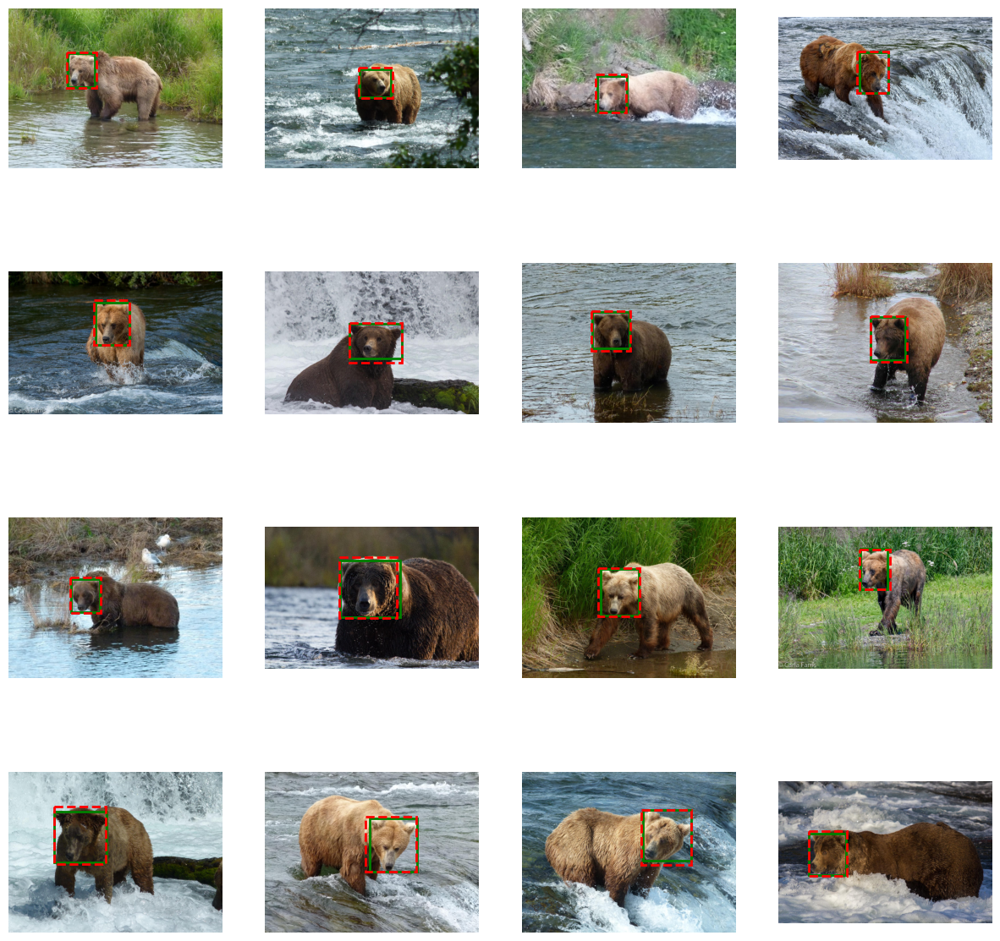

In [339]:
display_entries(around_quantile(df, 'IoU', 0.5, 0.005), ncols = 4)

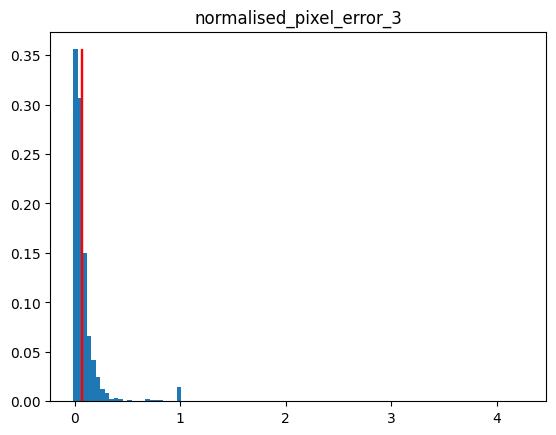

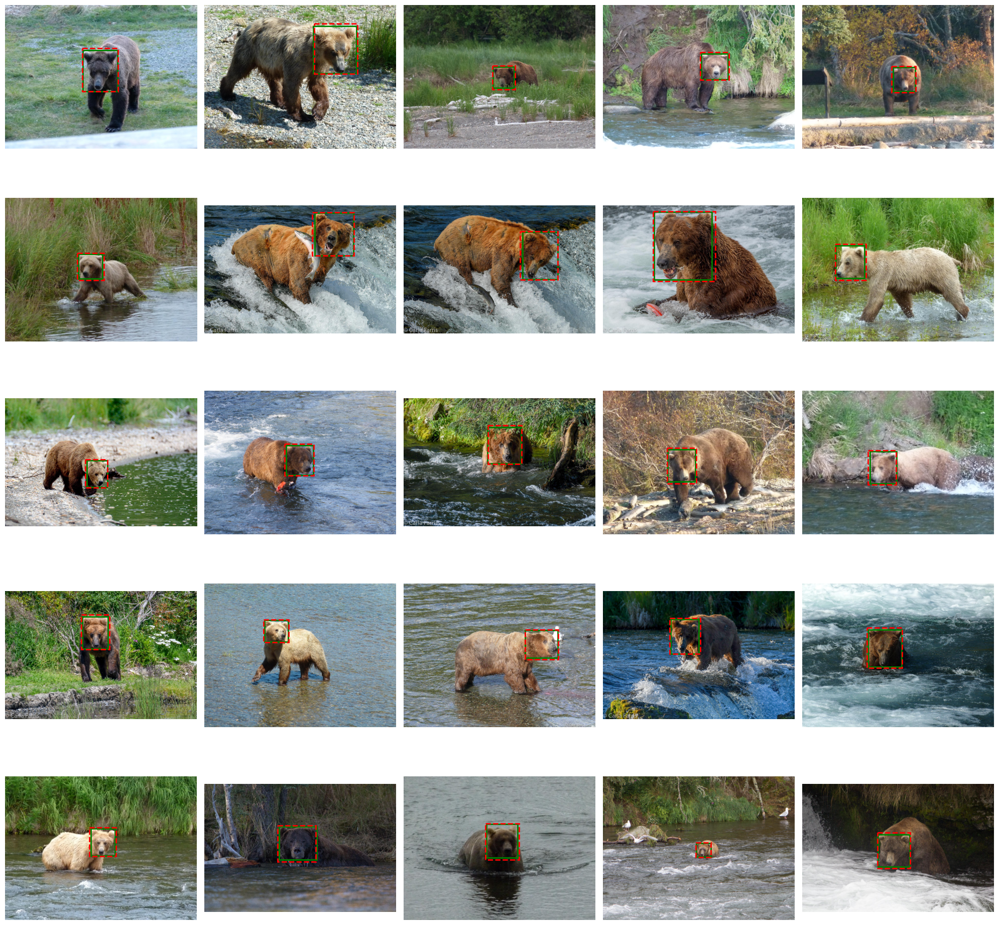

In [406]:
show_histogram_samples_from_quantile(df, 'normalised_pixel_error_3', quantile = 0.5, radius = 0.01,
                                     nelems = 25, ncols = 5, figsize = 20)